In [1]:
#Import Libraries
import pandas as pd
import numpy as np
import requests, xmltodict
from datetime import datetime, timedelta
from time import time
import glob

import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'NanumGothic'
import seaborn as sns
color_pal=sns.color_palette()

from sklearn.preprocessing import MinMaxScaler
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly, add_changepoints_to_plot, plot_cross_validation_metric
from prophet.diagnostics import cross_validation, performance_metrics

from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

import warnings
warnings.filterwarnings('ignore')

In [2]:
#실시간 data 불러오기 - 1. Sk Api
def rltm_poi():
    df = pd.DataFrame(columns=['ds','ticker', 'y', 'CongestionLevel'])
    def get_rltm_pois(df):
        # 장소 id 리스트
        ids = [6967166, 187961, 188485, 188592, 5783805, 5799875, 384515, 188633]
        # SK api 홈페이지에서 호출링크 가져옴
        base_url = "https://apis.openapi.sk.com/puzzle/place/congestion/rltm/pois/"
        headers = {
            "accept": "application/json",
            "Content-Type": "application/json",
            #"appKey": "RNM43SFreC8YwWjFIAGHY4VIpOi6jDHG98AHf7rN", # 앱키1 - 나 
            #"appKey": "Tt3yyROHTM8op2hEyv1Z34AXC2x8KPbn1iuD5Hlc", # 앱키2 - 민
            #"appKey": "w3oFktJUat2NPpDorwHZE7avbxcvdq0S7wx4vXfN", # 앱키3 - 아
            #"appkey": "e8wHh2tya84M88aReEpXCa5XTQf3xgo01aZG39k5", # 앱키4 
            "appkey": "j8VUTaKCsy9YwKQvy2FVR2fuz1HOvKdX8cWJFwDu" #앱키5 - 미리내
        }
        # API 응답 저장할 빈 딕셔너리 생성
        responses = {}

        # for문으로 id리스트 이용, API 호출하기
        # id를 키로하여 Json형식으로 받아와서 저장
        for place_id in ids:
            url = base_url + str(place_id)
            #query_params = "?date=" + str(date)
            #full_url = url + query_params
            response = requests.get(url, headers=headers)
            responses[place_id] = response.json() 

        # for문 reponse 딕셔너리 항목에서 키값으로 데이터 추출하고 각 변수에 저장
        for place_id, response_data in responses.items():
            #poi_id = response_data['contents']['poiId']
            poi_name = response_data['contents']['poiName']
            for item in response_data['contents']['rltm']:
                congestion = item['congestion']
                congestion_level = item['congestionLevel']
                datetime = item['datetime']

                # 'df'에 새로운 데이터 추가하고 인덱스 재설정
                df = df.append({
                    #'Id': poi_id,
                    'ds': datetime,
                    'ticker': poi_name,
                    'y': congestion,
                    'CongestionLevel': congestion_level
                }, ignore_index=True)

        return df
    def get_rltm_areas(df):
        ids = [9273,9270]
        base_url = "https://apis.openapi.sk.com/puzzle/place/congestion/rltm/areas/"
        headers = {
            "accept": "application/json",
            "Content-Type": "application/json",
            #"appKey": "RNM43SFreC8YwWjFIAGHY4VIpOi6jDHG98AHf7rN", # 앱키1 - 나 
            #"appKey": "Tt3yyROHTM8op2hEyv1Z34AXC2x8KPbn1iuD5Hlc", # 앱키2 - 민
            #"appKey": "w3oFktJUat2NPpDorwHZE7avbxcvdq0S7wx4vXfN", # 앱키3 - 아
            #"appkey": "e8wHh2tya84M88aReEpXCa5XTQf3xgo01aZG39k5", # 앱키4 
            "appkey": "j8VUTaKCsy9YwKQvy2FVR2fuz1HOvKdX8cWJFwDu" #앱키5 - 미리내
        }

        responses = {}
        for areas_id in ids:
            url = base_url + str(areas_id)
            #query_params = "?date=" + str(date)
            #full_url = url + query_params
            response = requests.get(url, headers=headers)
            responses[areas_id] = response.json() 


        for areas_id, response_data in responses.items():
            #area_id = response_data['contents']['areaId']
            area_name = response_data['contents']['areaName']

            congestion = response_data['contents']['rltm']['congestion']
            congestion_level = response_data['contents']['rltm']['congestionLevel']
            datetime = response_data['contents']['rltm']['datetime']
            df = df.append({
                #'Id': area_id,
                'ds': datetime,
                'ticker': area_name,
                'y': congestion,
                'CongestionLevel': congestion_level,
            }, ignore_index=True)

        return df
    
    df = get_rltm_pois(df)
    df = get_rltm_areas(df)
    df['ds']=pd.to_datetime(df['ds'], format='%Y%m%d%H%M%S')
    
    return df

In [298]:
df=rltm_poi()
df

,ds,ticker,y,CongestionLevel
0,20230622161000,롯데월드어드벤쳐,0.06623,3
1,20230622161000,롯데월드잠실점,0.20867,3
2,20230622161000,롯데백화점잠실점,0.03598,2
3,20230622161000,롯데마트제타플렉스점,0.02699,2
4,20230622161000,롯데백화점에비뉴엘월드타워점,0.13470,3
5,20230622161000,롯데월드몰,0.03072,2
6,20230622161000,올림픽공원세계평화의문,0.05647,3
7,20230622161000,올림픽공원,0.01330,1
8,20230622162000,잠실역 롯데월드,0.05115,3
9,20230622162000,방이동 먹자골목,0.03401,2


In [3]:
#data 불러오기 - 1. Sk Api
def load_poi():
    df = pd.DataFrame(columns=['Id', 'Name', 'Congestion', 'CongestionLevel', 'Datetime'])
    def get_data_pois(date, df):
        # 장소 id 리스트
        ids = [6967166, 187961, 188485, 188592, 5783805, 5799875, 384515, 188633]
        # SK api 홈페이지에서 호출링크 가져옴
        base_url = "https://apis.openapi.sk.com/puzzle/place/congestion/stat/raw/hourly/pois/"
        headers = {
            "accept": "application/json",
            "Content-Type": "application/json",
            #"appKey": "RNM43SFreC8YwWjFIAGHY4VIpOi6jDHG98AHf7rN", # 앱키1 - 나 
            #"appKey": "Tt3yyROHTM8op2hEyv1Z34AXC2x8KPbn1iuD5Hlc", # 앱키2 - 민
            #"appKey": "w3oFktJUat2NPpDorwHZE7avbxcvdq0S7wx4vXfN", # 앱키3 - 아
            #"appkey": "e8wHh2tya84M88aReEpXCa5XTQf3xgo01aZG39k5", # 앱키4 
            "appkey": "j8VUTaKCsy9YwKQvy2FVR2fuz1HOvKdX8cWJFwDu" #앱키5 - 미리내
        }
        # API 응답 저장할 빈 딕셔너리 생성
        responses = {}

        # for문으로 id리스트 이용, API 호출하기
        # id를 키로하여 Json형식으로 받아와서 저장
        for place_id in ids:
            url = base_url + str(place_id)
            query_params = "?date=" + str(date)
            full_url = url + query_params
            response = requests.get(full_url, headers=headers)
            responses[place_id] = response.json() 

        # for문 reponse 딕셔너리 항목에서 키값으로 데이터 추출하고 각 변수에 저장
        for place_id, response_data in responses.items():
            poi_id = response_data['contents']['poiId']
            poi_name = response_data['contents']['poiName']
            for item in response_data['contents']['raw']:
                congestion = item['congestion']
                congestion_level = item['congestionLevel']
                datetime = item['datetime']

                # 'df'에 새로운 데이터 추가하고 인덱스 재설정
                df = df.append({
                    'Id': poi_id,
                    'Name': poi_name,
                    'Congestion': congestion,
                    'CongestionLevel': congestion_level,
                    'Datetime': datetime
                }, ignore_index=True)

        return df
    def get_data_areas(date, df):
        ids = [9273,9270]
        base_url = "https://apis.openapi.sk.com/puzzle/place/congestion/stat/raw/hourly/areas/"
        headers = {
            "accept": "application/json",
            "Content-Type": "application/json",
            #"appKey": "RNM43SFreC8YwWjFIAGHY4VIpOi6jDHG98AHf7rN", # 앱키1 - 나 
            #"appKey": "Tt3yyROHTM8op2hEyv1Z34AXC2x8KPbn1iuD5Hlc", # 앱키2 - 민
            #"appKey": "w3oFktJUat2NPpDorwHZE7avbxcvdq0S7wx4vXfN", # 앱키3 - 아
            #"appkey": "e8wHh2tya84M88aReEpXCa5XTQf3xgo01aZG39k5", # 앱키4 
            "appkey": "j8VUTaKCsy9YwKQvy2FVR2fuz1HOvKdX8cWJFwDu" #앱키5 - 미리내
        }

        responses = {}
        for areas_id in ids:
            url = base_url + str(areas_id)
            query_params = "?date=" + str(date)
            full_url = url + query_params
            response = requests.get(full_url, headers=headers)
            responses[areas_id] = response.json() 

        for areas_id, response_data in responses.items():
            area_id = response_data['contents']['areaId']
            area_name = response_data['contents']['areaName']

            for item in response_data['contents']['raw']:
                congestion = item['congestion']
                congestion_level = item['congestionLevel']
                datetime = item['datetime']
                df = df.append({
                    'Id': area_id,
                    'Name': area_name,
                    'Congestion': congestion,
                    'CongestionLevel': congestion_level,
                    'Datetime': datetime
                }, ignore_index=True)

        return df
    df = get_data_pois('ystday',df)
    df = get_data_areas('ystday',df)
    return df

In [4]:
def raw_dataset():
    origin=pd.read_csv('congestion.csv') #2일전까지 데이터
    new=load_poi()                       #1일전(어제)데이터, api 불러오기
    mer_df=pd.concat([origin, new])
    mer_df=mer_df.drop_duplicates()      #중복제거
    mer_df.to_csv('congestion.csv', index=False) #저장
    return mer_df

In [5]:
def preprocess_api():
    con=raw_dataset()
    con['Datetime']=pd.to_datetime(con['Datetime'], format='%Y%m%d%H%M%S') #type: datetime
    con=con.rename(columns={'Datetime':'ds','Congestion':'y','Name':'ticker'}) 
    con=con.fillna(0) #congestion 결측값(None=>0)
    con=con[['ds','ticker','y']]
    con=con.drop_duplicates()

    #롯데월드어드벤쳐 + 롯데월드잠실점 합치기
    lotte=con.query('ticker=="롯데월드어드벤쳐"')
    world=con.query('ticker=="롯데월드잠실점"')
    mer_lotte=pd.merge(lotte, world, on='ds')
    mer_lotte['y']=mer_lotte['y_x']+mer_lotte['y_y']
    mer_lotte['ticker']='롯데월드'
    mer_lotte=mer_lotte[['ds','ticker','y']]
    con=con.query('ticker!="롯데월드어드벤쳐"&ticker!="롯데월드잠실점"')
    con=pd.concat([con,mer_lotte])

    con_piv=con.pivot_table('y','ds','ticker')
    return con, con_piv


In [7]:
#con, con_piv=preprocess_api()

In [201]:
con_piv.corr()

ticker,롯데마트제타플렉스점,롯데백화점에비뉴엘월드타워점,롯데백화점잠실점,롯데월드,롯데월드몰,방이동 먹자골목,올림픽공원,올림픽공원세계평화의문,잠실역 롯데월드
ticker,,,,,,,,,
롯데마트제타플렉스점,1.000000,0.696263,0.782488,0.740812,0.113844,0.302084,0.655620,0.513523,0.784296
롯데백화점에비뉴엘월드타워점,0.696263,1.000000,0.905018,0.887368,0.106715,0.435635,0.819455,0.610778,0.861589
롯데백화점잠실점,0.782488,0.905018,1.000000,0.960660,0.123436,0.354290,0.767222,0.659472,0.905540
롯데월드,0.740812,0.887368,0.960660,1.000000,0.150652,0.360094,0.721366,0.642530,0.900900
롯데월드몰,0.113844,0.106715,0.123436,0.150652,1.000000,0.161449,0.126462,0.086167,0.154730
방이동 먹자골목,0.302084,0.435635,0.354290,0.360094,0.161449,1.000000,0.469570,0.316411,0.548005
올림픽공원,0.655620,0.819455,0.767222,0.721366,0.126462,0.469570,1.000000,0.627226,0.796993
올림픽공원세계평화의문,0.513523,0.610778,0.659472,0.642530,0.086167,0.316411,0.627226,1.000000,0.653585
잠실역 롯데월드,0.784296,0.861589,0.905540,0.900900,0.154730,0.548005,0.796993,0.653585,1.000000


In [200]:
con_piv

ticker,롯데마트제타플렉스점,롯데백화점에비뉴엘월드타워점,롯데백화점잠실점,롯데월드,롯데월드몰,방이동 먹자골목,올림픽공원,올림픽공원세계평화의문,잠실역 롯데월드
ds,,,,,,,,,
2023-05-17 00:00:00,0.00027,0.00201,0.00058,0.00439,0.00357,0.02594,0.00305,0.00000,0.01250
2023-05-17 01:00:00,0.00018,0.00166,0.00039,0.00258,0.00643,0.02388,0.00245,0.00000,0.01144
2023-05-17 02:00:00,0.00018,0.00201,0.00039,0.00258,0.01072,0.02195,0.00204,0.00000,0.01183
2023-05-17 03:00:00,0.00018,0.00148,0.00035,0.00232,0.00786,0.02029,0.00195,0.00000,0.01164
2023-05-17 04:00:00,0.00009,0.00175,0.00043,0.00284,0.00429,0.01978,0.00198,0.00000,0.01150
...,...,...,...,...,...,...,...,...,...
2023-06-22 19:00:00,0.02115,0.11292,0.02808,0.22160,0.02887,0.04580,0.01272,0.05814,0.04231
2023-06-22 20:00:00,0.00547,0.10230,0.00959,0.15267,0.02511,0.04645,0.01175,0.05425,0.03477
2023-06-22 21:00:00,0.00064,0.06259,0.00231,0.02543,0.01760,0.04460,0.00878,0.03533,0.02354


In [6]:
def holiday_api(year):
    import requests, xmltodict
    decoding_key='6tblOMEsON8DV8mDJwrWHEDqFscUjGc0P1JLpq5QZE8Y/7jyE2piugAbGHDiy4oKYwbAaLiP+i9L1wb3HZ9VnQ=='
    url = 'http://apis.data.go.kr/B090041/openapi/service/SpcdeInfoService/getRestDeInfo'
    params ={'serviceKey' : decoding_key, 'pageNo' : '1', 'numOfRows' : '100', 'solYear' : str(year)}

    response = requests.get(url, params=params)

    holiday=xmltodict.parse(response.text)
    return holiday

In [7]:
def make_holiday_df():
    year=datetime.today().year
    
    holiday = {
        'holiday': [],
        'ds': [],
        'lower_window':-1,
        'upper_window':0
    }
    #api 불러오기
    holiday_data=holiday_api(year)
    
    for item in holiday_data['response']['body']['items']['item']:
        if item['isHoliday'] == 'Y':
            holiday['holiday'].append(item['dateName'])
            holiday['ds'].append(pd.to_datetime(item['locdate'], format='%Y%m%d'))
    
    holiday=pd.DataFrame(holiday)
    
    #기타 행사(1) 할로윈데이
    # 10월 마지막 주 토요일 날짜 계산
    october_last_sat = pd.to_datetime(pd.date_range(start=f'{year}-10-01', end=f'{year}-10-31', freq='WOM-4SAT')[-1])
    
    holloween=pd.DataFrame({
        'holiday': 'Holloween',
        'ds': pd.to_datetime([october_last_sat]),
        'lower_window':-1,
        'upper_window':1
    })
    
    
    #합치기
    holiday_df=pd.concat([holiday, holloween])
    holiday_df.reset_index(inplace=True, drop=True)
    
    return holiday_df

In [11]:
holiday_df=make_holiday_df()
holiday_df

,holiday,ds,lower_window,upper_window
0,1월1일,2023-01-01,-1,0
1,설날,2023-01-21,-1,0
2,설날,2023-01-22,-1,0
3,설날,2023-01-23,-1,0
4,대체공휴일,2023-01-24,-1,0
5,삼일절,2023-03-01,-1,0
6,어린이날,2023-05-05,-1,0
7,부처님오신날,2023-05-27,-1,0
8,대체공휴일,2023-05-29,-1,0
9,현충일,2023-06-06,-1,0


In [8]:
#하루전까지 날씨 (train)
def train_weather():
    df=pd.read_csv('train_weather.csv', encoding='ms949')
    df.ds=pd.to_datetime(df.ds)
    #df=df.rename(columns={'일시':'ds','기온(°C)':'TMP','강수량(mm)':'PCP'})
    #df=df[['ds','TMP','PCP']]
    df=df.fillna(method='ffill') #결측값 채우기
    
    #하루전 날씨 업데이트
    date=((datetime.now())-timedelta(days=2)).strftime('%Y%m%d')
    new=test_weather(date)
    new=new[:24]
    
    df=pd.concat([df, new])
    df=df.drop_duplicates()
    df.to_csv('train_weather.csv', index=False)
    return df

In [9]:
def test_weather(date=((datetime.now())-timedelta(days=1)).strftime('%Y%m%d')): #t~t+2 (당일~2일후까지 총 3일간 시간대별 기온, 강수량)
    import requests, xmltodict
    from datetime import datetime, timedelta
    
    decoding_key='6tblOMEsON8DV8mDJwrWHEDqFscUjGc0P1JLpq5QZE8Y/7jyE2piugAbGHDiy4oKYwbAaLiP+i9L1wb3HZ9VnQ=='
    url = 'http://apis.data.go.kr/1360000/VilageFcstInfoService_2.0/getVilageFcst'
    
    params ={'serviceKey' : decoding_key, 'pageNo' : '1', 'numOfRows' : '1000', 'dataType' : 'XML', 
             'base_date' : date, 
             'base_time' : '2300', 
             'nx' : '62', 'ny' : '126' } #송파구: 62(nx), 126(ny)
    response = requests.get(url, params=params)
    todict=xmltodict.parse(response.text)
    
    #dataframe 생성
    df=pd.DataFrame(columns=['ds', 'category', 'value'])

    for item in todict['response']['body']['items']['item']:
        fcst_date=item['fcstDate']
        fcst_time=item['fcstTime']
        category=item['category']
        value=item['fcstValue']

        data=pd.DataFrame({'ds': [fcst_date+fcst_time], 'category':[category], 'value':[value]})
        df=pd.concat([df, data])

    #전처리
    df['ds']=pd.to_datetime(df['ds'], format='%Y%m%d%H%M')
    df=df.query('category=="TMP"|category=="PCP"')
    df=df.pivot('ds','category','value')
    df=df.reset_index()
    df.TMP=df.TMP.apply(float)
    df['PCP']=df['PCP'].str.replace('mm','')
    df['PCP']=df['PCP'].replace({'강수없음':'0.0'}).apply(float)
    df=df.fillna(method='ffill') #혹시모를 결측값 처리
    df=df[['ds','TMP','PCP']] #열순서 변경
    df=df.iloc[:-1] #마지막 행 삭제
    
    return df

In [18]:
df=test_weather()
df

category,ds,TMP,PCP
0,2023-06-23 00:00:00,21.0,0.0
1,2023-06-23 01:00:00,21.0,0.0
2,2023-06-23 02:00:00,21.0,0.0
3,2023-06-23 03:00:00,21.0,0.0
4,2023-06-23 04:00:00,20.0,0.0
...,...,...,...
67,2023-06-25 19:00:00,30.0,0.0
68,2023-06-25 20:00:00,28.0,0.0
69,2023-06-25 21:00:00,27.0,0.0
70,2023-06-25 22:00:00,27.0,0.0


In [10]:
def create_features(mul):
    mul['hour']=mul['ds'].dt.hour

    # weekday 열 생성 (주중: 1, 주말: 0)
    mul['weekday']=mul['ds'].dt.dayofweek
    mul['weekday']=mul['weekday'].apply(lambda x: 0 if x >= 5 else 1)

    # season 열 생성
    mul['season']=mul['ds'].dt.month
    mul['season']=mul['season'].replace(12,0)
    mul['season']=pd.cut(mul['season'], [-1,2,5,8,11], labels=['Winter', 'Spring', 'Summer', 'Fall'])
    season_ohe=pd.get_dummies(mul['season'], prefix='season')
    mul=mul.join(season_ohe)

    #timebin 열 생성
    mul['timebin']=pd.cut(mul['hour'], bins=4, labels=False) #[(-0.023, 5.75] < (5.75, 11.5] < (11.5, 17.25] < (17.25, 23.0]]
    time_ohe=pd.get_dummies(mul['timebin'], prefix='tbin')
    mul=mul.join(time_ohe)
    # 결과 출력
    mul=mul.drop(columns=['hour','season','timebin'])
    
    return mul

## MODEL 1 - 날씨 포함 3일치 예측 (t~t+2)

11:24:17 - cmdstanpy - INFO - Chain [1] start processing
11:24:18 - cmdstanpy - INFO - Chain [1] done processing
11:24:18 - cmdstanpy - INFO - Chain [1] start processing


롯데마트제타플렉스점 MAE: 0.0043094786715635125 MAPE: 245299597827.72296


11:24:20 - cmdstanpy - INFO - Chain [1] done processing
11:24:21 - cmdstanpy - INFO - Chain [1] start processing


롯데백화점에비뉴엘월드타워점 MAE: 0.014682900785650089 MAPE: 1.1499228754164774


11:24:21 - cmdstanpy - INFO - Chain [1] done processing
11:24:21 - cmdstanpy - INFO - Chain [1] start processing


롯데백화점잠실점 MAE: 0.0057940781422335195 MAPE: 7401764289.207952


11:24:24 - cmdstanpy - INFO - Chain [1] done processing
11:24:24 - cmdstanpy - INFO - Chain [1] start processing


롯데월드 MAE: 0.025766189053713955 MAPE: 2.031495342536024


11:24:26 - cmdstanpy - INFO - Chain [1] done processing
11:24:27 - cmdstanpy - INFO - Chain [1] start processing


롯데월드몰 MAE: 0.010647045942110788 MAPE: 3.4448740634772848


11:24:27 - cmdstanpy - INFO - Chain [1] done processing
11:24:28 - cmdstanpy - INFO - Chain [1] start processing


방이동 먹자골목 MAE: 0.000919151269734925 MAPE: 0.03076947160021932


11:24:29 - cmdstanpy - INFO - Chain [1] done processing
11:24:30 - cmdstanpy - INFO - Chain [1] start processing


올림픽공원 MAE: 0.0018075167660817246 MAPE: 0.24615657141672598


11:24:31 - cmdstanpy - INFO - Chain [1] done processing
11:24:32 - cmdstanpy - INFO - Chain [1] start processing


올림픽공원세계평화의문 MAE: 0.015961227449413355 MAPE: 11889163882074.49


11:24:33 - cmdstanpy - INFO - Chain [1] done processing


잠실역 롯데월드 MAE: 0.001761639657022361 MAPE: 0.07247120478842618
Time: 16.61725378036499


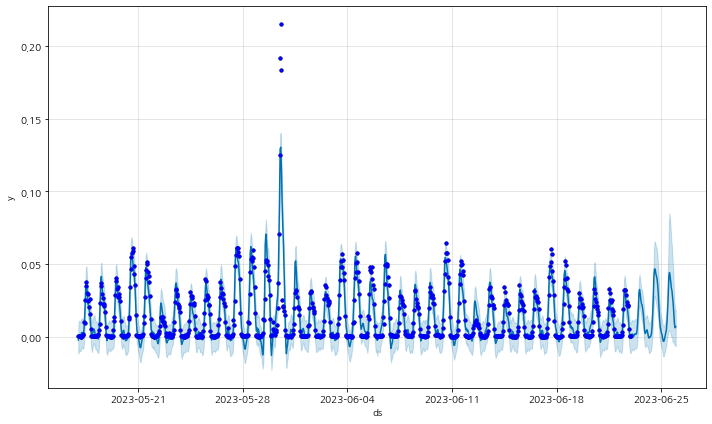

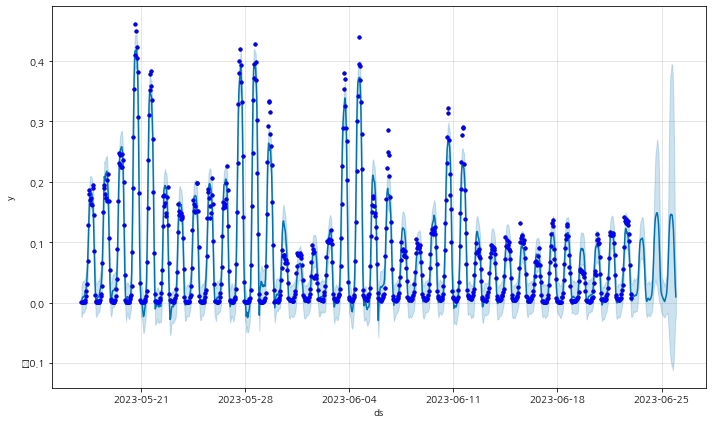

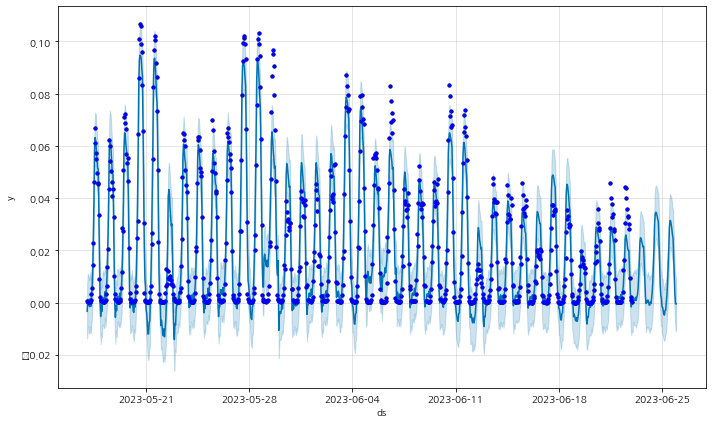

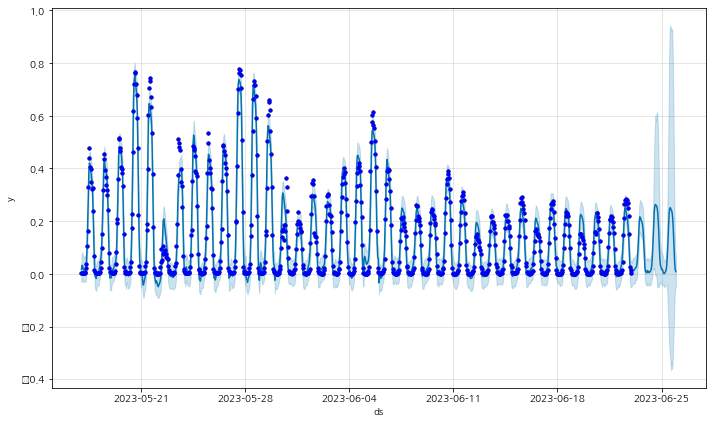

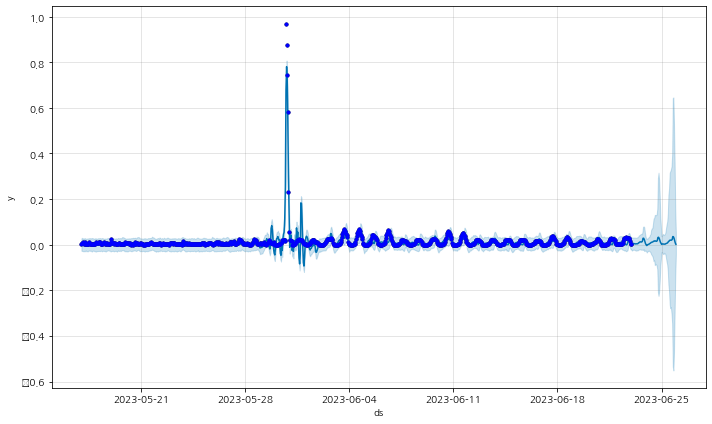

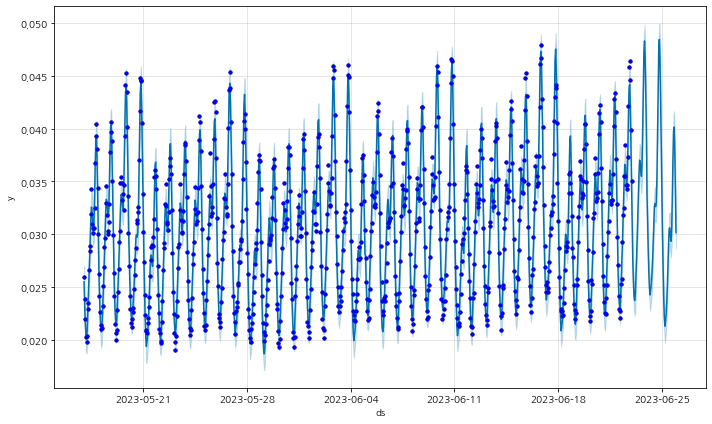

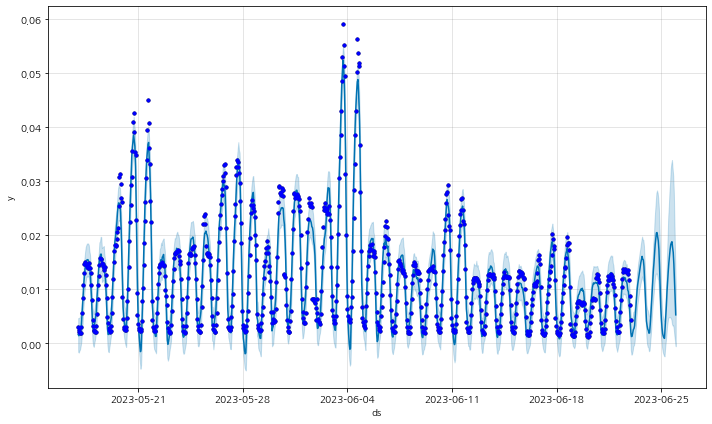

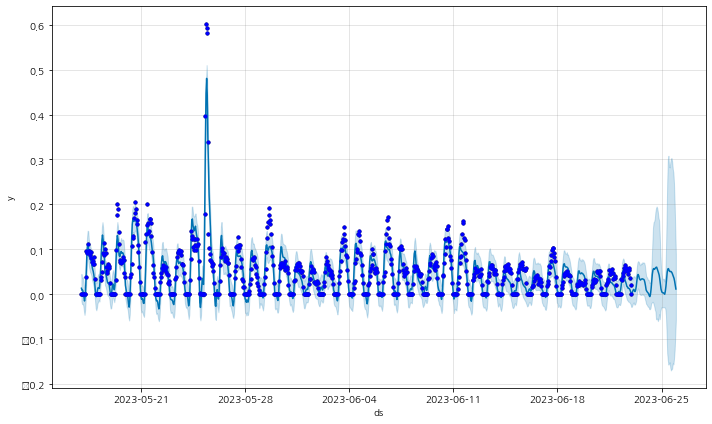

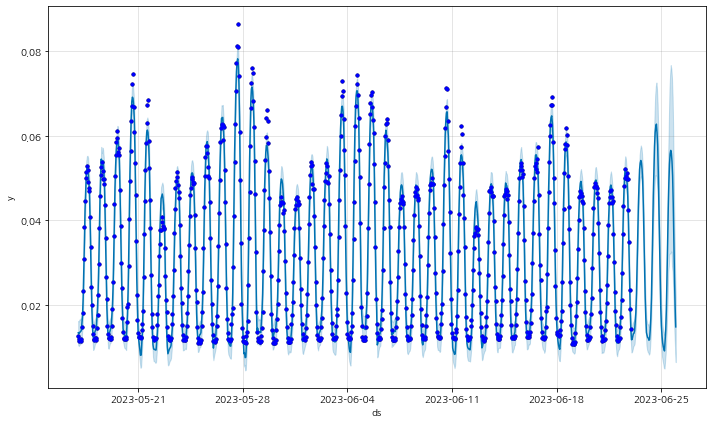

In [148]:
#feature engineering
#t~t+2, 3일치 다변량 예측
#logistic => 음수 제한 작동안함, 그냥 음수는 0으로 처리하게끔 코딩해야 할 듯, =>linear가 더 잘 나옴
#Train dataset 불러오기
#con, con_piv=preprocess_api()

train_wea=train_weather()
test_wea=test_weather()
#holiday_df=holiday_df
holiday_df=make_holiday_df()


#날씨변수 병합
mul=pd.merge(con, train_wea, on='ds') 

#날짜파생 변수 병합
mul=create_features(mul)
groups_by_ticker=mul.groupby('ticker')
groups_by_ticker.groups.keys()
ticker_list=list(groups_by_ticker.groups.keys())


start_time=time()

for_loop_forecast=pd.DataFrame()

for ticker in ticker_list:
    group=groups_by_ticker.get_group(ticker)
    
    m = Prophet(interval_width=0.8, 
                #changepoint_range=0.8, #default가 good
                #n_changepoints=20,
                seasonality_mode='multiplicative', #good
                holidays_prior_scale=15,
                holidays=holiday_df) 
   
    #변수 추가
    m.add_regressor('TMP', standardize=False)
    m.add_regressor('PCP', standardize=False)
    m.add_regressor('weekday', standardize=False)
    m.add_regressor('season_Winter', standardize=False)
    m.add_regressor('season_Spring', standardize=False)
    m.add_regressor('season_Summer', standardize=False)
    m.add_regressor('season_Fall', standardize=False)
    m.add_regressor('tbin_0', standardize=False)
    m.add_regressor('tbin_1', standardize=False)
    m.add_regressor('tbin_2', standardize=False)
    m.add_regressor('tbin_3', standardize=False)

    #주간 주기성 요소 추가 (*)
    m.add_seasonality(name='weekly', period=7, fourier_order=10)
    
    m.fit(group)
    
    #test dataset 불러오기
    test_w=pd.concat([train_wea, test_wea]) #날씨 병합 888+72
    future=m.make_future_dataframe(periods=3*24, freq='h')

    future=pd.merge(future, test_w[['ds','TMP','PCP']], on='ds', how='outer')
    future=create_features(future)
    forecast=m.predict(future)

    
    #시각화
    fig=m.plot(forecast)
    ax=fig.gca()
    ax.plot(group['ds'],group['y'],'b.')
    
    #performance=pd.merge(group, forecast[['ds','yhat','yhat_lower','yhat_upper']], on='ds')
    mae=mean_absolute_error(group['y'], forecast['yhat'][:-72])
    mape=mean_absolute_percentage_error(group['y'], forecast['yhat'][:-72])
    print(ticker,'MAE:', mae,'MAPE:',mape)
    
    forecast['ticker']=group['ticker'].iloc[0]
    forecast=forecast[['ds','ticker','yhat','yhat_upper','yhat_lower']]
    
    #전체 장소 합치기
    for_loop_forecast=pd.concat([for_loop_forecast, forecast])
    
    
print('Time:', time()-start_time)

In [195]:
for_loop_forecast

,ds,ticker,yhat,yhat_upper,yhat_lower
0,2023-05-17 00:00:00,롯데마트제타플렉스점,0.000001,0.007353,-0.011597
1,2023-05-17 01:00:00,롯데마트제타플렉스점,0.000465,0.011061,-0.008841
2,2023-05-17 02:00:00,롯데마트제타플렉스점,0.000744,0.010465,-0.009497
3,2023-05-17 03:00:00,롯데마트제타플렉스점,0.000001,0.009773,-0.010041
4,2023-05-17 04:00:00,롯데마트제타플렉스점,0.000828,0.011031,-0.009556
...,...,...,...,...,...
955,2023-06-25 19:00:00,잠실역 롯데월드,0.044039,0.061231,0.023468
956,2023-06-25 20:00:00,잠실역 롯데월드,0.035403,0.049481,0.018186
957,2023-06-25 21:00:00,잠실역 롯데월드,0.026767,0.038361,0.013020
958,2023-06-25 22:00:00,잠실역 롯데월드,0.019790,0.028374,0.009467


In [199]:
#3일치 예측값
#음수 값 -> 0으로 대체
for_loop_forecast['yhat']=for_loop_forecast.apply(lambda x: 1e-6 if x['yhat']<0 else x['yhat'], axis=1)
total_forecast=for_loop_forecast.copy()
predictions=pd.merge(mul,total_forecast, on=['ds','ticker'], how='outer')[['ds','ticker','y','yhat','yhat_upper','yhat_lower']]
predictions=predictions.iloc[-3*24*9:]
predictions

,ds,ticker,y,yhat,yhat_upper,yhat_lower
7992,2023-06-23 00:00:00,방이동 먹자골목,NaN,0.030129,0.031715,0.028673
7993,2023-06-23 00:00:00,잠실역 롯데월드,NaN,0.011696,0.014711,0.008673
7994,2023-06-23 00:00:00,올림픽공원,NaN,0.001239,0.004423,-0.002113
7995,2023-06-23 00:00:00,롯데월드몰,NaN,0.002175,0.029264,-0.025923
7996,2023-06-23 00:00:00,롯데마트제타플렉스점,NaN,0.000160,0.010446,-0.010036
...,...,...,...,...,...,...
8635,2023-06-25 23:00:00,롯데월드,NaN,0.008924,0.066453,-0.049340
8636,2023-06-25 23:00:00,올림픽공원,NaN,0.005258,0.010630,-0.000548
8637,2023-06-25 23:00:00,롯데마트제타플렉스점,NaN,0.006864,0.018702,-0.006348
8638,2023-06-25 23:00:00,롯데백화점에비뉴엘월드타워점,NaN,0.009594,0.040571,-0.021867


In [192]:
#이상 탐지
results=pd.merge(mul,for_loop_forecast, on=['ds','ticker'], how='outer') 
results=results[['ds','ticker','y','yhat','yhat_upper','yhat_lower']] 

results['error']=results['y']-results['yhat']
results['uncertainty']=results['yhat_upper']-results['yhat_lower']

#숫자가 작아질 수록 이상치로 정의될 경우가 많아짐. 
#1: 평소보다 많을 때, -1: 평소보다 적을 때

results['anomaly'] = results.apply(lambda x: -1 if x['error'] < -1.5 * x['uncertainty'] 
                                   else (1 if x['error'] > 1.2 * x['uncertainty'] else 0), axis=1)
                                    #민감도를 사용자가 설정할 수 있게 할지? ex)민감: 0.7, 덜 민감:0.85 등.. 
def two_weeks_ago_mean(x):
    if (x.name-7*24*9 >= 0) & (x.name-7*2*24*9 >= 0):
        if (pd.notna(results.iloc[x.name-7*24*9]['y'])) & (pd.notna(results.iloc[x.name-7*2*24*9]['y'])):
            return ((results.iloc[x.name-7*24*9]['y'])+(results.iloc[x.name-7*2*24*9]['y']))/2
    else:
        None

results['avg_2w']=results.apply(two_weeks_ago_mean, axis=1) #최근 2주간 평균
results['anomaly2']=results.apply(lambda x: 1 if x['y'] > 2.0 * x['avg_2w'] else 0, axis=1)

results

,ds,ticker,y,yhat,yhat_upper,yhat_lower,error,uncertainty,anomaly,avg_2w,anomaly2
0,2023-05-17 00:00:00,롯데백화점잠실점,0.00058,0.000001,0.007329,-0.013737,0.000579,0.021066,0,NaN,0
1,2023-05-17 00:00:00,롯데마트제타플렉스점,0.00027,0.000001,0.007353,-0.011597,0.000269,0.018950,0,NaN,0
2,2023-05-17 00:00:00,롯데백화점에비뉴엘월드타워점,0.00201,0.002548,0.028024,-0.023471,-0.000538,0.051494,0,NaN,0
3,2023-05-17 00:00:00,롯데월드몰,0.00357,0.000001,0.027911,-0.026680,0.003569,0.054591,0,NaN,0
4,2023-05-17 00:00:00,올림픽공원세계평화의문,0.00000,0.013506,0.045446,-0.015413,-0.013506,0.060859,0,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...
8635,2023-06-25 19:00:00,잠실역 롯데월드,NaN,0.044039,0.061231,0.023468,NaN,0.037763,0,0.000405,0
8636,2023-06-25 20:00:00,잠실역 롯데월드,NaN,0.035403,0.049481,0.018186,NaN,0.031295,0,0.003160,0
8637,2023-06-25 21:00:00,잠실역 롯데월드,NaN,0.026767,0.038361,0.013020,NaN,0.025340,0,0.014660,0
8638,2023-06-25 22:00:00,잠실역 롯데월드,NaN,0.019790,0.028374,0.009467,NaN,0.018907,0,0.028405,0


In [48]:
results.query('anomaly==1') #평소보다 많을 때

,ds,ticker,y,yhat,yhat_upper,yhat_lower,error,uncertainty,anomaly
635,2023-05-19 22:00:00,올림픽공원,0.02607,0.015952,0.018971,0.012805,0.010118,0.006165,1
931,2023-05-21 07:00:00,올림픽공원세계평화의문,0.11595,0.035102,0.064218,0.006321,0.080848,0.057898,1
1007,2023-05-21 15:00:00,롯데월드,0.74387,0.622390,0.670787,0.573152,0.121480,0.097635,1
1013,2023-05-21 16:00:00,올림픽공원,0.04502,0.036730,0.039899,0.033425,0.008290,0.006474,1
1014,2023-05-21 16:00:00,잠실역 롯데월드,0.06842,0.060778,0.063879,0.057919,0.007642,0.005960,1
1403,2023-05-23 11:00:00,롯데월드,0.37693,0.207333,0.257544,0.158619,0.169597,0.098924,1
1412,2023-05-23 12:00:00,롯데월드,0.51068,0.309347,0.357981,0.258338,0.201333,0.099644,1
1421,2023-05-23 13:00:00,롯데월드,0.49546,0.359323,0.410113,0.311413,0.136137,0.098700,1
1813,2023-05-25 09:00:00,올림픽공원세계평화의문,0.60199,0.447106,0.474284,0.416328,0.154884,0.057955,1
1822,2023-05-25 10:00:00,올림픽공원세계평화의문,0.58074,0.480403,0.509593,0.452409,0.100337,0.057185,1


In [53]:
results.query('anomaly==-1') #평소보다 적을 때

,ds,ticker,y,yhat,yhat_upper,yhat_lower,error,uncertainty,anomaly
1197,2023-05-22 13:00:00,롯데백화점잠실점,0.00950,0.043330,0.052721,0.032803,-0.033830,0.019918,-1
1206,2023-05-22 14:00:00,롯데백화점잠실점,0.00918,0.041698,0.052178,0.030757,-0.032518,0.021421,-1
1849,2023-05-25 13:00:00,올림픽공원세계평화의문,0.13449,0.275411,0.304285,0.245799,-0.140921,0.058487,-1
1858,2023-05-25 14:00:00,올림픽공원세계평화의문,0.10334,0.218711,0.246851,0.187331,-0.115371,0.059520,-1
1867,2023-05-25 15:00:00,올림픽공원세계평화의문,0.09024,0.187068,0.214653,0.157753,-0.096828,0.056900,-1
2944,2023-05-30 15:00:00,롯데마트제타플렉스점,0.02526,0.094989,0.104458,0.084359,-0.069729,0.020100,-1
2951,2023-05-30 15:00:00,롯데월드,0.12752,0.274692,0.318839,0.226295,-0.147172,0.092544,-1
2953,2023-05-30 16:00:00,롯데마트제타플렉스점,0.02124,0.078746,0.089114,0.068536,-0.057506,0.020578,-1
2955,2023-05-30 16:00:00,롯데월드몰,0.01805,0.114848,0.142250,0.086673,-0.096798,0.055577,-1
2962,2023-05-30 17:00:00,롯데마트제타플렉스점,0.02024,0.067411,0.076887,0.057271,-0.047171,0.019616,-1


In [54]:
#시각화
import plotly.graph_objects as go

groups_by_ticker=results.groupby('ticker')
groups_by_ticker.groups.keys()
ticker_list=list(groups_by_ticker.groups.keys())
for ticker in ticker_list:
    group=groups_by_ticker.get_group(ticker)
    # 데이터프레임의 시간 열을 x축으로 설정하여 그래프 생성
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=group['ds'], y=group['y'], mode='lines', name='Actual'))
    fig.add_trace(go.Scatter(x=group['ds'], y=group['yhat'], mode='lines', name='Predicted'))
    fig.add_trace(go.Scatter(x=group[group['anomaly'] != 0]['ds'], y=group[group['anomaly'] != 0]['y'],
                             mode='markers', name='Anomaly', marker=dict(color='black', size=4)))

    fig.update_layout(title=f'{ticker}: Anomaly Detection', xaxis_title='Date', yaxis_title='Value')
    fig.show()

In [193]:
import plotly.graph_objects as go

groups_by_ticker=results.groupby('ticker')
groups_by_ticker.groups.keys()
ticker_list=list(groups_by_ticker.groups.keys())
for ticker in ticker_list:
    group=groups_by_ticker.get_group(ticker)
    # 데이터프레임의 시간 열을 x축으로 설정하여 그래프 생성
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=group['ds'], y=group['y'], mode='lines', name='Actual'))
    fig.add_trace(go.Scatter(x=group['ds'], y=group['yhat'], mode='lines', name='Predicted'))
    fig.add_trace(go.Scatter(x=group[group['anomaly2'] != 0]['ds'], y=group[group['anomaly2'] != 0]['y'],
                             mode='markers', name='Anomaly', marker=dict(color='black', size=4)))

    fig.update_layout(title=f'{ticker}: Anomaly Detection', xaxis_title='Date', yaxis_title='Value')
    fig.show()

In [180]:
#10분 단위로 Resample
groups_by_ticker=results.groupby('ticker')

dfs_by_ticker=pd.DataFrame()
for ticker, group in groups_by_ticker:
    group=groups_by_ticker.get_group(ticker)
    group.set_index('ds',inplace=True)
    group=group.iloc[-3*24:] #오늘 날짜~3일 후까지
    
    resampled_group=group[['y','yhat','yhat_upper','yhat_lower','uncertainty']].resample('10T').interpolate(method='linear')
    resampled_group=resampled_group.reset_index()
    resampled_group['ticker']=group['ticker'].iloc[0]
    
    mer_df=pd.merge(group, resampled_group, on=['ds','ticker','y','yhat','yhat_upper','yhat_lower','uncertainty'], how='outer')
    mer_df=mer_df.sort_values(by='ds')
    dfs_by_ticker=pd.concat([dfs_by_ticker,mer_df])
dfs_by_ticker

,ds,ticker,y,yhat,yhat_upper,yhat_lower,error,uncertainty,anomaly
0,2023-06-23 00:00:00,롯데마트제타플렉스점,NaN,0.000160,0.010446,-0.010036,NaN,0.020482,0.0
72,2023-06-23 00:10:00,롯데마트제타플렉스점,NaN,0.000445,0.010638,-0.009736,NaN,0.020374,NaN
73,2023-06-23 00:20:00,롯데마트제타플렉스점,NaN,0.000730,0.010830,-0.009435,NaN,0.020265,NaN
74,2023-06-23 00:30:00,롯데마트제타플렉스점,NaN,0.001014,0.011022,-0.009135,NaN,0.020157,NaN
75,2023-06-23 00:40:00,롯데마트제타플렉스점,NaN,0.001299,0.011214,-0.008834,NaN,0.020048,NaN
...,...,...,...,...,...,...,...,...,...
423,2023-06-25 22:20:00,잠실역 롯데월드,NaN,0.018112,0.026203,0.008448,NaN,0.017755,NaN
424,2023-06-25 22:30:00,잠실역 롯데월드,NaN,0.017273,0.025118,0.007939,NaN,0.017179,NaN
425,2023-06-25 22:40:00,잠실역 롯데월드,NaN,0.016434,0.024033,0.007430,NaN,0.016603,NaN
426,2023-06-25 22:50:00,잠실역 롯데월드,NaN,0.015595,0.022947,0.006921,NaN,0.016027,NaN


In [156]:
#실시간 데이터 불러오기 (호출 시간: 11:37 최소 20분~최대 1시간)
rltm=rltm_poi()
rltm

,ds,ticker,y,CongestionLevel
0,2023-06-23 10:40:00,롯데월드어드벤쳐,0.02801,2
1,2023-06-23 10:40:00,롯데월드잠실점,0.09840,3
2,2023-06-23 10:40:00,롯데백화점잠실점,0.01516,1
3,2023-06-23 10:40:00,롯데마트제타플렉스점,0.00620,1
4,2023-06-23 10:40:00,롯데백화점에비뉴엘월드타워점,0.04976,2
5,2023-06-23 10:40:00,롯데월드몰,0.01005,1
6,2023-06-23 10:40:00,올림픽공원세계평화의문,0.05813,3
7,2023-06-23 10:40:00,올림픽공원,0.01390,1
8,2023-06-23 11:00:00,잠실역 롯데월드,0.03705,2
9,2023-06-23 11:00:00,방이동 먹자골목,0.03379,2


In [ ]:
이상치
-실시간 호출 -> 범위(1~4단계) -> 4단계 (절대적인 값) 
1-적다
2-보통
3-많다
4-아주많다 

-예측치에서 벗어나는 경우(상대적인 탐지)
anomaly :-1 : 

In [184]:
res=pd.merge(rltm, dfs_by_ticker, on=['ds','ticker'], how='inner')
res['error']=res['y_x']-res['yhat']
res['anomaly'] = res.apply(lambda x: -1 if x['error'] < -1.5 * x['uncertainty'] #적은 인구수
                                   else (1 if x['error'] > 1.2 * x['uncertainty'] #많은 인구수
                                         else 0), axis=1)

In [185]:
res

,ds,ticker,y_x,CongestionLevel,y_y,yhat,yhat_upper,yhat_lower,error,uncertainty,anomaly
0,2023-06-23 10:40:00,롯데백화점잠실점,0.01516,1,NaN,0.013595,0.024111,0.003833,0.001565,0.020279,0
1,2023-06-23 10:40:00,롯데마트제타플렉스점,0.00620,1,NaN,0.016322,0.026335,0.006585,-0.010122,0.019750,0
2,2023-06-23 10:40:00,롯데백화점에비뉴엘월드타워점,0.04976,2,NaN,0.047014,0.075453,0.019334,0.002746,0.056119,0
3,2023-06-23 10:40:00,롯데월드몰,0.01005,1,NaN,0.007583,0.037845,-0.021856,0.002467,0.059701,0
4,2023-06-23 10:40:00,올림픽공원세계평화의문,0.05813,3,NaN,0.042535,0.072965,0.010726,0.015595,0.062239,0
5,2023-06-23 10:40:00,올림픽공원,0.01390,1,NaN,0.011444,0.014707,0.008135,0.002456,0.006572,0
6,2023-06-23 11:00:00,잠실역 롯데월드,0.03705,2,NaN,0.043188,0.046459,0.040035,-0.006138,0.006424,0
7,2023-06-23 11:00:00,방이동 먹자골목,0.03379,2,NaN,0.035651,0.037153,0.034225,-0.001861,0.002928,0


## MODEL 2 - 날씨 제외 일주일 후까지 예측

10:00:19 - cmdstanpy - INFO - Chain [1] start processing
10:00:20 - cmdstanpy - INFO - Chain [1] done processing
10:00:21 - cmdstanpy - INFO - Chain [1] start processing


롯데마트제타플렉스점 MAE: 0.0042997311897814885 MAPE: 249838566266.16107


10:00:22 - cmdstanpy - INFO - Chain [1] done processing
10:00:23 - cmdstanpy - INFO - Chain [1] start processing


롯데백화점에비뉴엘월드타워점 MAE: 0.014933698514210066 MAPE: 1.231056461679571


10:00:23 - cmdstanpy - INFO - Chain [1] done processing


롯데백화점잠실점 MAE: 0.0052968353009290765 MAPE: 8328091828.74535


10:00:24 - cmdstanpy - INFO - Chain [1] start processing
10:00:26 - cmdstanpy - INFO - Chain [1] done processing
10:00:27 - cmdstanpy - INFO - Chain [1] start processing


롯데월드 MAE: 0.025516974996604515 MAPE: 2.130733000250419


10:00:29 - cmdstanpy - INFO - Chain [1] done processing
10:00:29 - cmdstanpy - INFO - Chain [1] start processing


롯데월드몰 MAE: 0.010730160627124258 MAPE: 3.3046755930807996


10:00:30 - cmdstanpy - INFO - Chain [1] done processing
10:00:30 - cmdstanpy - INFO - Chain [1] start processing


방이동 먹자골목 MAE: 0.0009173349896017942 MAPE: 0.030682632777442407


10:00:32 - cmdstanpy - INFO - Chain [1] done processing
10:00:32 - cmdstanpy - INFO - Chain [1] start processing


올림픽공원 MAE: 0.001770096081775528 MAPE: 0.2403288880617899


10:00:34 - cmdstanpy - INFO - Chain [1] done processing
10:00:34 - cmdstanpy - INFO - Chain [1] start processing


올림픽공원세계평화의문 MAE: 0.015842848681809598 MAPE: 12549133493075.256


10:00:36 - cmdstanpy - INFO - Chain [1] done processing


잠실역 롯데월드 MAE: 0.0017893224790015425 MAPE: 0.07230664153790259
Time: 17.375015258789062


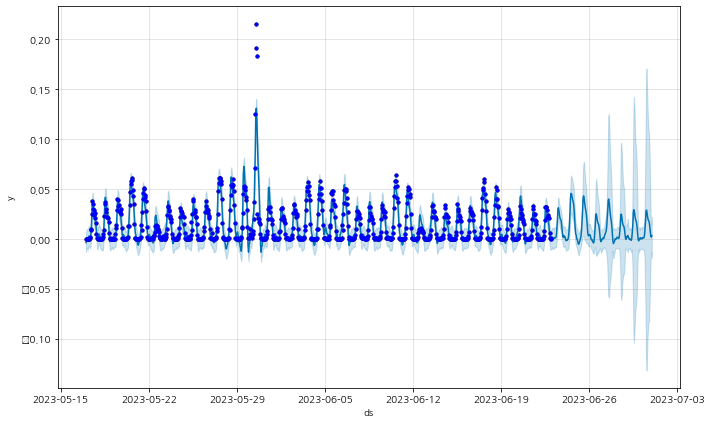

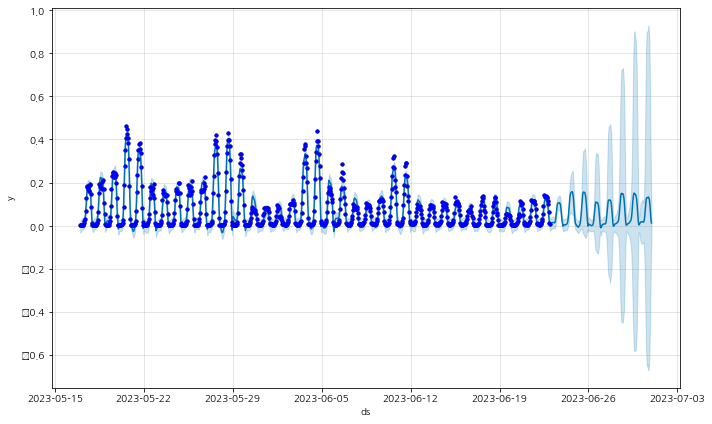

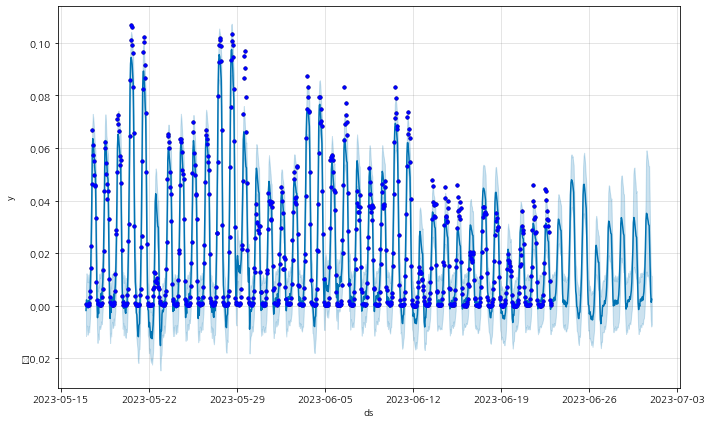

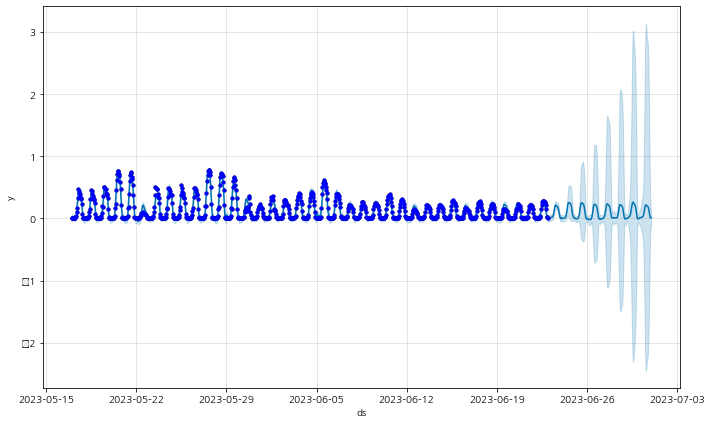

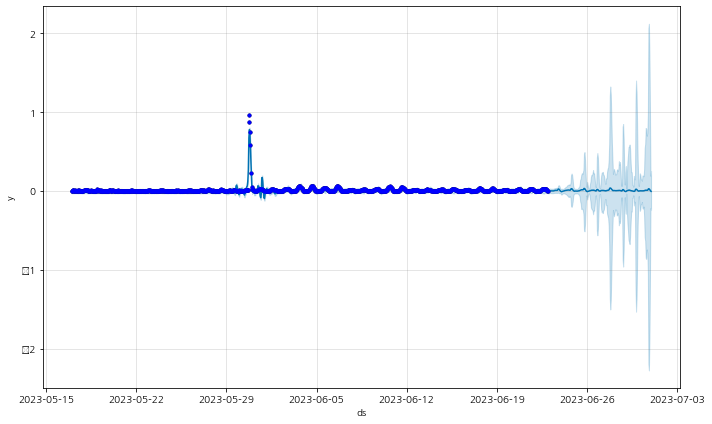

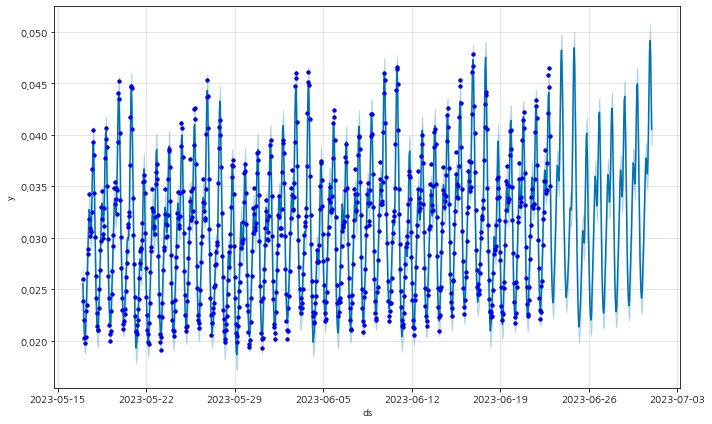

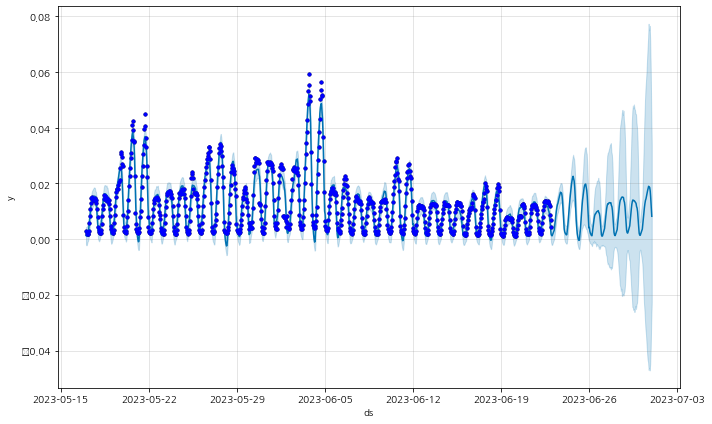

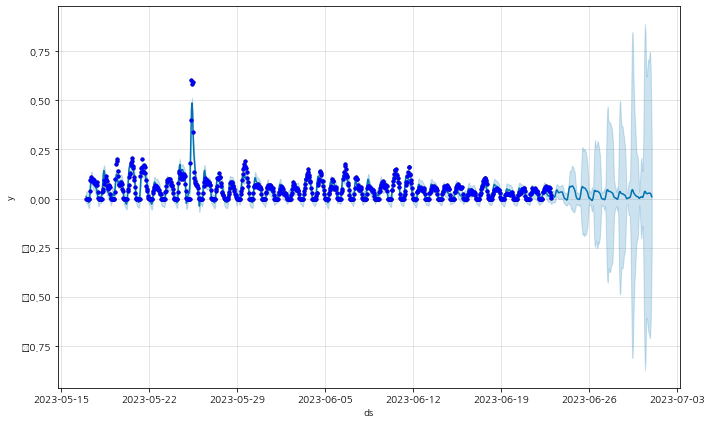

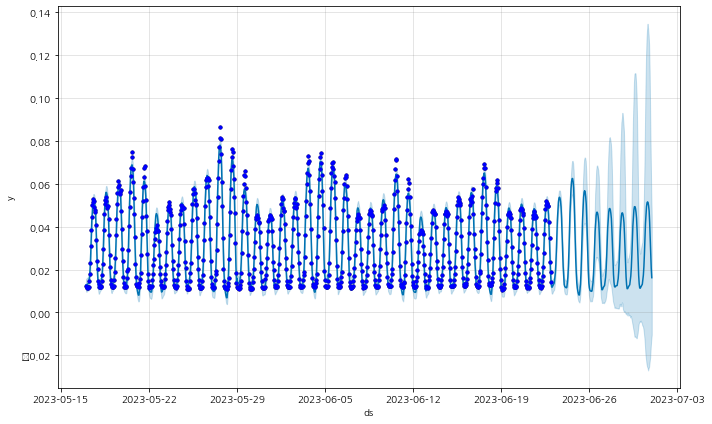

In [55]:
#feature engineering
#날씨 제외 날짜 파생변수로 다변량 예측, 7일후까지 (날씨가 큰 영향을 미치지 않았음)
#logistic => 음수 제한 작동안함, 그냥 음수는 0으로 처리하게끔 코딩해야 할 듯, =>linear가 더 잘 나옴

#Train dataset 불러오기
#con, con_piv=preprocess_api()
#con.columns=['ds','ticker','y']
#train_wea=
#train_wea=train_weather()
#holiday_df=holiday_df
holiday_df=make_holiday_df()
#test_wea=test_weather()
#날씨변수 병합
mul=pd.merge(con, train_wea, on='ds') 

#날짜파생 변수 병합
mul=create_features(mul)
groups_by_ticker=mul.groupby('ticker')
groups_by_ticker.groups.keys()
ticker_list=list(groups_by_ticker.groups.keys())


start_time=time()

for_loop_forecast=pd.DataFrame()

for ticker in ticker_list:
    group=groups_by_ticker.get_group(ticker)
    
    m = Prophet(interval_width=0.8, 
                #changepoint_range=0.2,
                seasonality_mode='multiplicative', #good
                holidays_prior_scale=15,
                holidays=holiday_df) 
   
    #변수 추가
    #m.add_regressor('TMP', standardize=False)
    #m.add_regressor('PCP', standardize=False)
    m.add_regressor('weekday', standardize=False)
    m.add_regressor('season_Winter', standardize=False)
    m.add_regressor('season_Spring', standardize=False)
    m.add_regressor('season_Summer', standardize=False)
    m.add_regressor('season_Fall', standardize=False)
    m.add_regressor('tbin_0', standardize=False)
    m.add_regressor('tbin_1', standardize=False)
    m.add_regressor('tbin_2', standardize=False)
    m.add_regressor('tbin_3', standardize=False)

    #주간 주기성 요소 추가 (*)
    m.add_seasonality(name='weekly', period=7, fourier_order=10)
    
    m.fit(group)
    
    #test dataset 불러오기
    #test_w=pd.concat([train_wea, test_wea]) #날씨 병합
    future=m.make_future_dataframe(periods=8*24, freq='h') #일주일 후까지 예측

    #future=pd.merge(future, test_w[['ds','TMP','PCP']], on='ds', how='outer')
    future=create_features(future)
    forecast=m.predict(future)

    
    #시각화
    fig=m.plot(forecast)
    ax=fig.gca()
    ax.plot(group['ds'],group['y'],'b.')
    
    #performance=pd.merge(group, forecast[['ds','yhat','yhat_lower','yhat_upper']], on='ds')
    mae=mean_absolute_error(group['y'], forecast['yhat'][:-8*24])
    mape=mean_absolute_percentage_error(group['y'], forecast['yhat'][:-8*24])
    print(ticker,'MAE:', mae,'MAPE:',mape)
    
    forecast['ticker']=group['ticker'].iloc[0]
    forecast=forecast[['ds','ticker','yhat','yhat_upper','yhat_lower']]
    
    #전체 장소 합치기
    for_loop_forecast=pd.concat([for_loop_forecast, forecast])
    
    
print('Time:', time()-start_time)

## 이상탐지  
이 과정을 함수화 할 수 없을까.. 0, 1, -1을 리턴하게끔..

In [146]:
#음수 값 -> 0으로 대체
for_loop_forecast['yhat']=for_loop_forecast.apply(lambda x: 1e-6 if x['yhat']<0 else x['yhat'], axis=1)
results=for_loop_forecast.copy()

results=pd.merge(mul,for_loop_forecast, on=['ds','ticker'], how='outer') 
results=results[['ds','ticker','y','yhat','yhat_upper','yhat_lower']] 

results['error']=results['y']-results['yhat']
results['uncertainty']=results['yhat_upper']-results['yhat_lower']

#숫자가 작아질 수록 이상치로 정의될 경우가 많아짐. 
#1: 평소보다 많을 때, -1: 평소보다 적을 때

results['anomaly'] = results.apply(lambda x: -1 if x['error'] < -1.5 * x['uncertainty'] 
                                   else (1 if x['error'] > 1.2 * x['uncertainty'] else 0), axis=1)

def two_weeks_ago_mean(x):
    if (pd.notna(results.iloc[x.name-7*24*9]['y'])) & (pd.notna(results.iloc[x.name-7*2*24*9]['y'])):
        return ((results.iloc[x.name-7*24*9]['y'])+(results.iloc[x.name-7*2*24*9]['y']))/2
    else:
        None

results['avg_2w']=results.apply(two_weeks_ago_mean, axis=1) #최근 2주간 평균
results['anomaly2']=results.apply(lambda x: 1 if x['y'] > 2.0 * x['avg_2w'] else 0, axis=1)
results

,ds,ticker,y,yhat,yhat_upper,yhat_lower,error,uncertainty,anomaly,avg_2w,anomaly2
0,2023-05-17 00:00:00,롯데백화점잠실점,0.00058,0.000001,0.007499,-0.011472,0.000579,0.018971,0,NaN,0
1,2023-05-17 00:00:00,롯데마트제타플렉스점,0.00027,0.000001,0.006295,-0.013104,0.000269,0.019399,0,NaN,0
2,2023-05-17 00:00:00,롯데백화점에비뉴엘월드타워점,0.00201,0.000001,0.019129,-0.032355,0.002009,0.051484,0,NaN,0
3,2023-05-17 00:00:00,롯데월드몰,0.00357,0.000059,0.026929,-0.028331,0.003511,0.055260,0,NaN,0
4,2023-05-17 00:00:00,올림픽공원세계평화의문,0.00000,0.011384,0.040149,-0.016500,-0.011384,0.056649,0,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...
9715,2023-06-30 19:00:00,잠실역 롯데월드,NaN,0.041817,0.111712,-0.022769,NaN,0.134481,0,NaN,0
9716,2023-06-30 20:00:00,잠실역 롯데월드,NaN,0.034611,0.092278,-0.020881,NaN,0.113159,0,NaN,0
9717,2023-06-30 21:00:00,잠실역 롯데월드,NaN,0.027009,0.073166,-0.016178,NaN,0.089344,0,NaN,0
9718,2023-06-30 22:00:00,잠실역 롯데월드,NaN,0.020564,0.056525,-0.012926,NaN,0.069451,0,NaN,0


In [277]:
import plotly.graph_objects as go

groups_by_ticker=results.groupby('ticker')
groups_by_ticker.groups.keys()
ticker_list=list(groups_by_ticker.groups.keys())
for ticker in ticker_list:
    group=groups_by_ticker.get_group(ticker)
    # 데이터프레임의 시간 열을 x축으로 설정하여 그래프 생성
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=group['ds'], y=group['y'], mode='lines', name='Actual'))
    fig.add_trace(go.Scatter(x=group['ds'], y=group['yhat'], mode='lines', name='Predicted'))
    fig.add_trace(go.Scatter(x=group[group['anomaly'] != 0]['ds'], y=group[group['anomaly'] != 0]['y'],
                             mode='markers', name='Anomaly', marker=dict(color='black', size=4)))

    fig.update_layout(title=f'{ticker}: Anomaly Detection', xaxis_title='Date', yaxis_title='Value')
    fig.show()

In [147]:
import plotly.graph_objects as go

groups_by_ticker=results.groupby('ticker')
groups_by_ticker.groups.keys()
ticker_list=list(groups_by_ticker.groups.keys())
for ticker in ticker_list:
    group=groups_by_ticker.get_group(ticker)
    # 데이터프레임의 시간 열을 x축으로 설정하여 그래프 생성
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=group['ds'], y=group['y'], mode='lines', name='Actual'))
    fig.add_trace(go.Scatter(x=group['ds'], y=group['yhat'], mode='lines', name='Predicted'))
    fig.add_trace(go.Scatter(x=group[group['anomaly2'] != 0]['ds'], y=group[group['anomaly2'] != 0]['y'],
                             mode='markers', name='Anomaly', marker=dict(color='black', size=4)))

    fig.update_layout(title=f'{ticker}: Anomaly Detection', xaxis_title='Date', yaxis_title='Value')
    fig.show()